GRUPO 16
***Proyecto: Detección de tumores en lunares***

**Probado con dataset COMPLETO !!!**

---

# 1.   Comprensión del Negocio:

Objetivo: Clasificar imágenes de lunares como benignos o malignos para ayudar en el diagnóstico médico.

---
# 2.   Comprensión de los Datos:

- Recolectar y explorar imágenes de lunares benignos y malignos.
- Verificar la estructura de los datos y la calidad de las imágenes.

In [ ]:
from google.colab import drive
from google.colab.patches import cv2_imshow
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import graycomatrix, graycoprops
from skimage import measure
import tensorflow as tf
from keras.preprocessing.image import ImageDataGenerator
from keras.applications import VGG16
from keras.models import Model, load_model
from keras.layers import Dense, Flatten, Dropout
from keras.optimizers import Adam

In [ ]:
# Montar Google Drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
# Rutas de los datos
train_dir_benign = '/content/gdrive/MyDrive/dataset/train/benign/'
train_dir_malignant = '/content/gdrive/MyDrive/dataset/train/malignant/'
test_dir_benign = '/content/gdrive/MyDrive/dataset/test/benign/'
test_dir_malignant = '/content/gdrive/MyDrive/dataset/test/malignant/'

# Rutas generales de Train/Test:
train_dir = '/content/gdrive/MyDrive/dataset/train'
test_dir = '/content/gdrive/MyDrive/dataset/test'

# Rutas de todas las imágenes benignas y malignas
benign_paths = [os.path.join(train_dir_benign, img) for img in os.listdir(train_dir_benign)]
malignant_paths = [os.path.join(train_dir_malignant, img) for img in os.listdir(train_dir_malignant)]

## **EDA:**

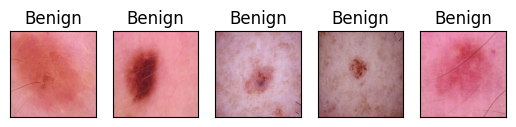

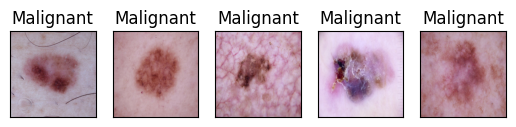

In [ ]:
# Visualizamos algunas imágenes:
def show_sample_images(path, title):
    # Extraemos los nombres de cada imagen (5) hallada en os.listdir(path)
    img_names = os.listdir(path)[:5]
    img_paths = []
    # Generamos los paths a cada imagen
    for name in img_names:
        img_paths.append(os.path.join(path, name))
    # Iteramos cada path y generamos la tira de imágenes
    for i in range(len(img_paths)):
        plt.subplot(1, 5, i+1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        img = cv2.imread(img_paths[i])
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(title)
    plt.show()

show_sample_images(train_dir_benign, 'Benign')
show_sample_images(train_dir_malignant, 'Malignant')

### Análisis de Intensidad de Píxeles (Histogramas)

1. **Histogramas de Intensidad de Píxeles:**
   - Visualizando los histogramas de las imágenes benignas y malignas, podemos observar la distribución de intensidad de píxeles en cada clase.
   - **Análisis:** Comparar la distribución de intensidad de píxeles entre las imágenes benignas y malignas. Por ejemplo, podemos buscar diferencias significativas en términos de rango de intensidad, picos de frecuencia, etc.

2. **Media y Varianza de Intensidad:**
   - Calcular la media y la varianza de la intensidad de píxeles en cada clase.
   - **Análisis:** Comparar la media y la varianza de las imágenes benignas y malignas. Las malignas podrían mostrar una mayor variabilidad o una intensidad media diferente debido a características específicas de los lunares malignos.

### Análisis de Textura

3. **Matriz de Co-ocurrencia de Píxeles (GLCM):**
   - Calcular la matriz de co-ocurrencia de píxeles para cada imagen y luego promediar o sumar las matrices para obtener características de textura.
   - **Análisis:** Observar diferencias en las características de textura entre las imágenes benignas y malignas. Las malignas pueden mostrar texturas más irregulares o patrones más complejos.

### Análisis Morfológico

4. **Características Morfológicas:**
   - Calcular características como el área, la circularidad, el perímetro, etc., para cada lunar.
   - **Análisis:** Comparar las características morfológicas de los lunares benignos y malignos. Los lunares malignos pueden tener un área mayor, una forma más irregular, etc.

### Análisis de Color

5. **Histogramas de Color (si aplica):**
   - Si las imágenes son a color, se pueden analizar los histogramas de los canales de color.
   - **Análisis:** Comparar los histogramas de color entre las imágenes benignas y malignas. Podría haber diferencias significativas en la distribución del color entre las dos clases.

### Análisis General

6. **Distribución y Balance de Clases:**
   - Revisar la distribución de imágenes entre las clases benignas y malignas.
   - **Análisis:** Asegurarse de que las clases estén balanceadas para evitar sesgos en el modelo de clasificación.

### Consideraciones Especiales

7. **Preprocesamiento:**
   - Verificar la calidad de las imágenes y considerar cualquier necesidad de preprocesamiento adicional, como corrección de iluminación, normalización, etc.

8. **Visualización de Ejemplos:**
   - Seleccionar ejemplos representativos de cada clase y visualizarlos para comprender las características visuales distintivas.

***1. Histogramas de Intensidad de Píxeles***

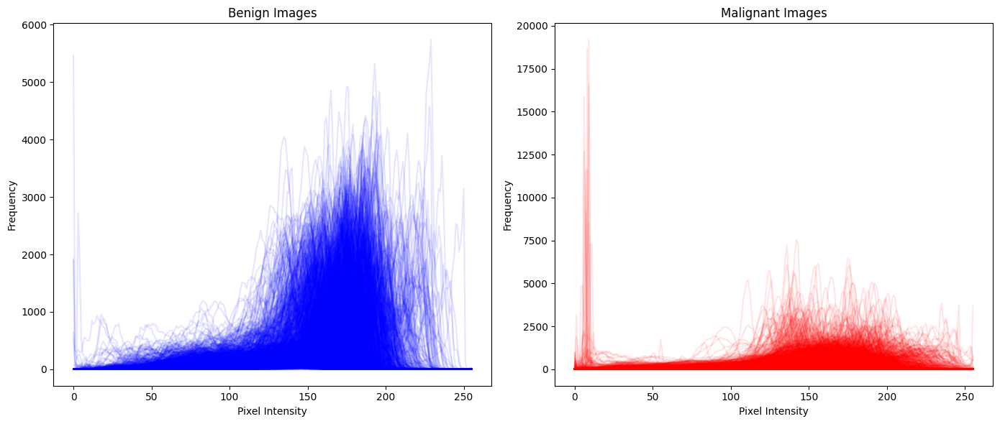

In [ ]:
# Función para obtener el histograma de una imagen
def get_image_histogram(path):
    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    hist = cv2.calcHist([img], [0], None, [256], [0, 256])
    return hist.flatten()

# Obtener los histogramas de intensidad de píxeles para todas las imágenes
benign_histograms = [get_image_histogram(path) for path in benign_paths]
malignant_histograms = [get_image_histogram(path) for path in malignant_paths]

# Mostrar los histogramas en un gráfico
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
for hist in benign_histograms:
    plt.plot(hist, color='blue', alpha=0.1)
plt.title('Benign Images')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')

plt.subplot(1, 2, 2)
for hist in malignant_histograms:
    plt.plot(hist, color='red', alpha=0.1)
plt.title('Malignant Images')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

**2. Media y Varianza de Intensidad de Píxeles**

In [ ]:
# Función para obtener la media y la varianza de intensidad de píxeles
def get_mean_var_intensity(images):
    means = []
    variances = []
    for img_path in images:
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        means.append(np.mean(img))
        variances.append(np.var(img))
    return means, variances

# Obtener la media y la varianza de intensidad de píxeles para todas las imágenes
benign_means, benign_variances = get_mean_var_intensity(benign_paths)
malignant_means, malignant_variances = get_mean_var_intensity(malignant_paths)

# Imprimir resultados
print("Benign Images:")
print(f"Mean intensity: {np.mean(benign_means)}, Variance: {np.mean(benign_variances)}")
print("Malignant Images:")
print(f"Mean intensity: {np.mean(malignant_means)}, Variance: {np.mean(malignant_variances)}")

Benign Images:
Mean intensity: 156.60704843949298, Variance: 836.629545417883
Malignant Images:
Mean intensity: 150.7564311967738, Variance: 1141.3191728164686


**3. Matriz de Co-ocurrencia de Píxeles (GLCM)**

In [ ]:
# Función para obtener la matriz de co-ocurrencia y características de textura
def get_texture_features(paths):
    textures = []
    for img_path in paths:
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        glcm = graycomatrix(img, [1], [0, np.pi/4, np.pi/2, 3*np.pi/4], 256, symmetric=True, normed=True)
        contrast = graycoprops(glcm, 'contrast').flatten().mean()
        dissimilarity = graycoprops(glcm, 'dissimilarity').flatten().mean()
        homogeneity = graycoprops(glcm, 'homogeneity').flatten().mean()
        energy = graycoprops(glcm, 'energy').flatten().mean()
        correlation = graycoprops(glcm, 'correlation').flatten().mean()
        textures.append([contrast, dissimilarity, homogeneity, energy, correlation])
    return textures

# Obtener características de textura para imágenes benignas y malignas
benign_texture_features = get_texture_features(benign_paths)
malignant_texture_features = get_texture_features(malignant_paths)

# Imprimir resultados
# Características de textura de imágenes benignas y malignas:
# Contraste, Disimilitud o Diferencia, Homogeneidad, Energía y Correlación

print("Benign Images Texture Features:")
print(f"Contrast: {np.mean([feat[0] for feat in benign_texture_features])}")
print(f"Dissimilarity: {np.mean([feat[1] for feat in benign_texture_features])}")
print(f"Homogeneity: {np.mean([feat[2] for feat in benign_texture_features])}")
print(f"Energy: {np.mean([feat[3] for feat in benign_texture_features])}")
print(f"Correlation: {np.mean([feat[4] for feat in benign_texture_features])}")

print("\nMalignant Images Texture Features:")
print(f"Contrast: {np.mean([feat[0] for feat in malignant_texture_features])}")
print(f"Dissimilarity: {np.mean([feat[1] for feat in malignant_texture_features])}")
print(f"Homogeneity: {np.mean([feat[2] for feat in malignant_texture_features])}")
print(f"Energy: {np.mean([feat[3] for feat in malignant_texture_features])}")
print(f"Correlation: {np.mean([feat[4] for feat in malignant_texture_features])}")

Benign Images Texture Features:
Contrast: 32.38227369692166
Dissimilarity: 3.2149427426569397
Homogeneity: 0.3269883943840943
Energy: 0.048907850510408225
Correlation: 0.9748802813110766

Malignant Images Texture Features:
Contrast: 56.176004640491826
Dissimilarity: 4.209538542617532
Homogeneity: 0.2839734923657784
Energy: 0.04218651112070876
Correlation: 0.9577672026791049


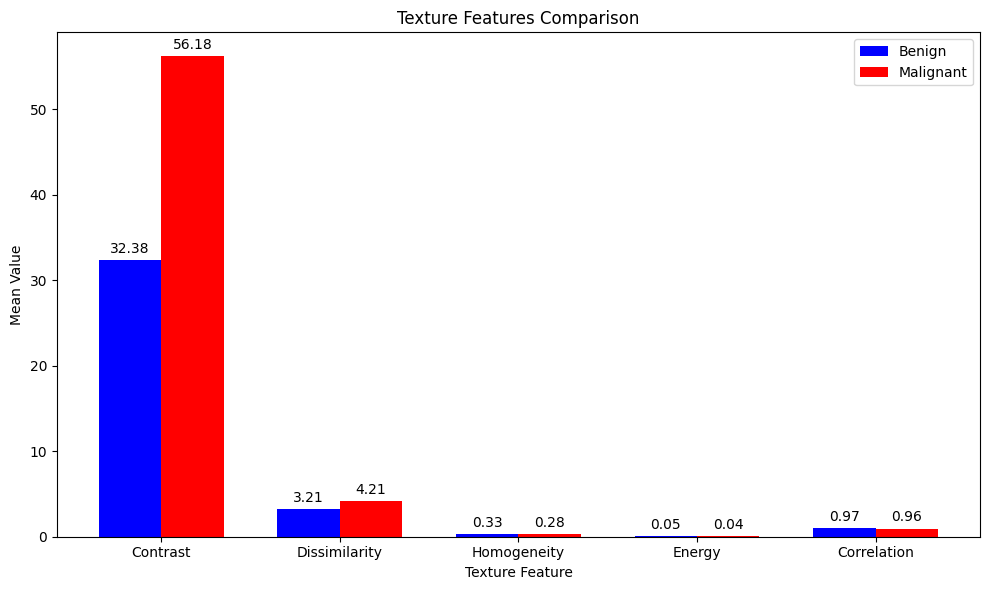

In [ ]:
# Resultados en diagrama de barras para ser visualizado
# Calcular medias de características de textura
benign_means = np.mean(benign_texture_features, axis=0)
malignant_means = np.mean(malignant_texture_features, axis=0)

# Etiquetas para las características
labels = ['Contrast', 'Dissimilarity', 'Homogeneity', 'Energy', 'Correlation']

# Crear gráfico de barras para comparar características de textura entre benignas y malignas
x = np.arange(len(labels))
width = 0.35

fig, ax = plt.subplots(figsize=(10, 6))
rects1 = ax.bar(x - width/2, benign_means, width, label='Benign', color='blue')
rects2 = ax.bar(x + width/2, malignant_means, width, label='Malignant', color='red')

ax.set_xlabel('Texture Feature')
ax.set_ylabel('Mean Value')
ax.set_title('Texture Features Comparison')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()

def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{:.2f}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

autolabel(rects1)
autolabel(rects2)
fig.tight_layout()
plt.show()

**4. Características Morfológicas**

In [ ]:
# Función para obtener características morfológicas
def get_morphology_features(paths):
    morphology = []
    for img_path in paths:
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        label_img = measure.label(img)
        regions = measure.regionprops(label_img)
        area = regions[0].area
        perimeter = regions[0].perimeter
        solidity = regions[0].solidity
        eccentricity = regions[0].eccentricity
        morphology.append([area, perimeter, solidity, eccentricity])
    return morphology

# Obtener características morfológicas para imágenes benignas y malignas
benign_morphology_features = get_morphology_features(benign_paths)
malignant_morphology_features = get_morphology_features(malignant_paths)

# Imprimir resultados
# Características morfológicas de imágenes benignas: Área, Perímetro, Solidez, Excentricidad.

print("Benign Images Morphology Features:")
print(f"Area: {np.mean([feat[0] for feat in benign_morphology_features])}")
print(f"Perimeter: {np.mean([feat[1] for feat in benign_morphology_features])}")
print(f"Solidity: {np.mean([feat[2] for feat in benign_morphology_features])}")
print(f"Eccentricity: {np.mean([feat[3] for feat in benign_morphology_features])}")

print("\nMalignant Images Morphology Features:")
print(f"Area: {np.mean([feat[0] for feat in malignant_morphology_features])}")
print(f"Perimeter: {np.mean([feat[1] for feat in malignant_morphology_features])}")
print(f"Solidity: {np.mean([feat[2] for feat in malignant_morphology_features])}")
print(f"Eccentricity: {np.mean([feat[3] for feat in malignant_morphology_features])}")

Benign Images Morphology Features:
Area: 2.1743055555555557
Perimeter: 0.96890096355396
Solidity: 0.9604208327451299
Eccentricity: 0.3678888922282052

Malignant Images Morphology Features:
Area: 50.953216374269005
Perimeter: 6.790569313100376
Solidity: 0.969624167094493
Eccentricity: 0.2743389542127535


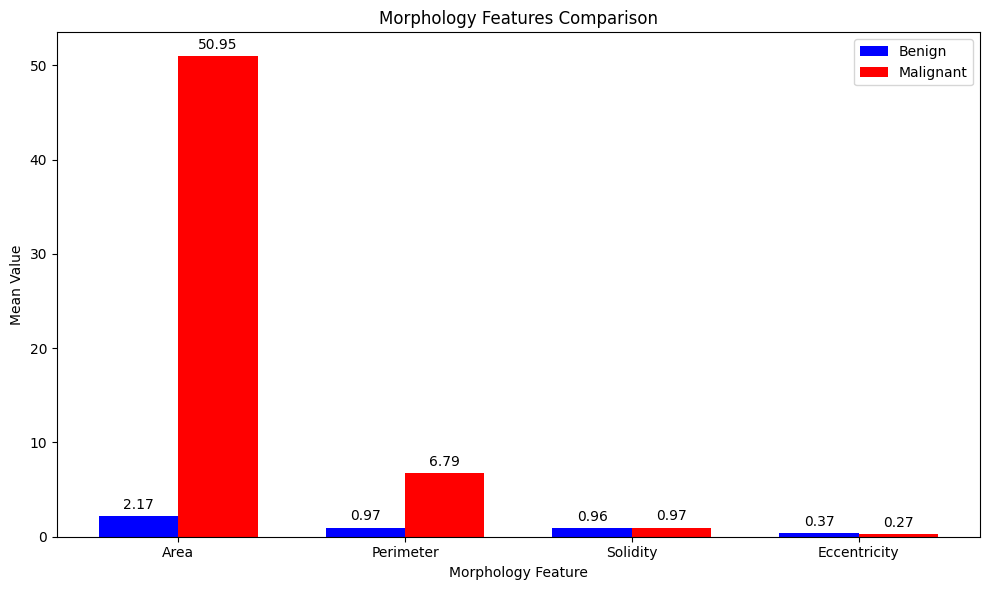

In [ ]:
# Comparación de características Morfológicas, pero muestra resultados en diagrama de barras para ser visualizado

# Calcular medias de características Morfológicas:
benign_means = np.mean(benign_morphology_features, axis=0)
malignant_means = np.mean(malignant_morphology_features, axis=0)

# Etiquetas para las características
labels = ['Area', 'Perimeter', 'Solidity', 'Eccentricity']

# Crear gráfico de barras para comparar características morfológicas entre benignas y malignas
x = np.arange(len(labels))
width = 0.35

fig, ax = plt.subplots(figsize=(10, 6))
rects1 = ax.bar(x - width/2, benign_means, width, label='Benign', color='blue')
rects2 = ax.bar(x + width/2, malignant_means, width, label='Malignant', color='red')

ax.set_xlabel('Morphology Feature')
ax.set_ylabel('Mean Value')
ax.set_title('Morphology Features Comparison')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()

def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{:.2f}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

autolabel(rects1)
autolabel(rects2)
fig.tight_layout()
plt.show()

 El gráfico de barras compara las características morfológicas promedio entre las imágenes benignas y malignas. Cada barra representa una métrica morfológica (área, perímetro, solidez y excentricidad), con colores distintos para cada clase (benigna en azul y maligna en rojo).

Este tipo de visualización es útil para identificar diferencias significativas en las características morfológicas extraídas de las imágenes, lo que puede ser relevante para la clasificación automática de lunares benignos y malignos.

**5. Histogramas de Color**

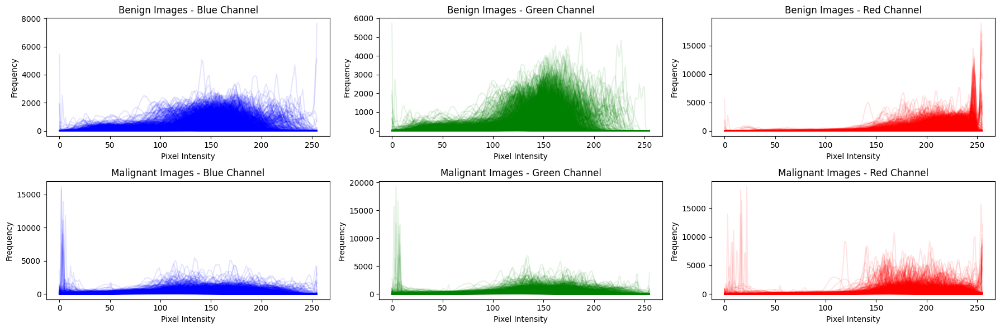

In [ ]:
# Función para obtener el histograma de color de una imagen
def get_color_histogram(image_path):
    img = cv2.imread(image_path)
    hist_b = cv2.calcHist([img], [0], None, [256], [0, 256])
    hist_g = cv2.calcHist([img], [1], None, [256], [0, 256])
    hist_r = cv2.calcHist([img], [2], None, [256], [0, 256])
    return hist_b.flatten(), hist_g.flatten(), hist_r.flatten()

# Obtener los histogramas de color para imágenes benignas y malignas
benign_color_histograms_b = []
benign_color_histograms_g = []
benign_color_histograms_r = []
malignant_color_histograms_b = []
malignant_color_histograms_g = []
malignant_color_histograms_r = []

for img_path in benign_paths:
    hist_b, hist_g, hist_r = get_color_histogram(img_path)
    benign_color_histograms_b.append(hist_b)
    benign_color_histograms_g.append(hist_g)
    benign_color_histograms_r.append(hist_r)

for img_path in malignant_paths:
    hist_b, hist_g, hist_r = get_color_histogram(img_path)
    malignant_color_histograms_b.append(hist_b)
    malignant_color_histograms_g.append(hist_g)
    malignant_color_histograms_r.append(hist_r)

# Mostrar los histogramas de color en un gráfico
plt.figure(figsize=(18, 6))

plt.subplot(2, 3, 1)
for hist in benign_color_histograms_b:
    plt.plot(hist, color='blue', alpha=0.1)
plt.title('Benign Images - Blue Channel')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')

plt.subplot(2, 3, 2)
for hist in benign_color_histograms_g:
    plt.plot(hist, color='green', alpha=0.1)
plt.title('Benign Images - Green Channel')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')

plt.subplot(2, 3, 3)
for hist in benign_color_histograms_r:
    plt.plot(hist, color='red', alpha=0.1)
plt.title('Benign Images - Red Channel')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')

plt.subplot(2, 3, 4)
for hist in malignant_color_histograms_b:
    plt.plot(hist, color='blue', alpha=0.1)
plt.title('Malignant Images - Blue Channel')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')

plt.subplot(2, 3, 5)
for hist in malignant_color_histograms_g:
    plt.plot(hist, color='green', alpha=0.1)
plt.title('Malignant Images - Green Channel')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')

plt.subplot(2, 3, 6)
for hist in malignant_color_histograms_r:
    plt.plot(hist, color='red', alpha=0.1)
plt.title('Malignant Images - Red Channel')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

**6. Análisis General**
Para completar el análisis exploratorio, también podemos considerar algunos aspectos generales adicionales:

**Distribución y Balance de Clases**

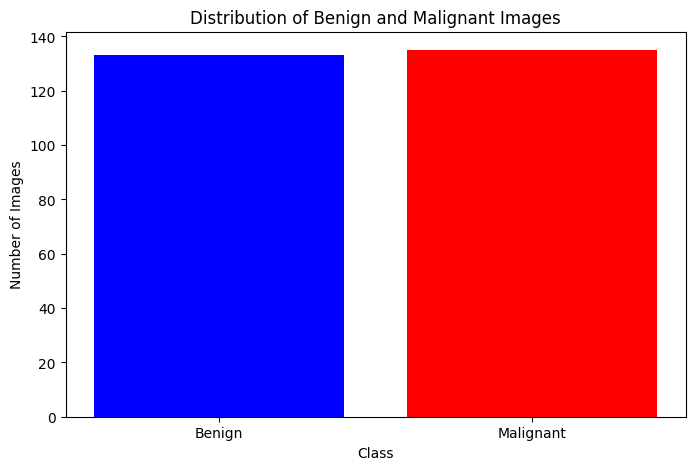

In [ ]:
# Contar el número de imágenes en cada clase
num_benign = len(benign_paths)
num_malignant = len(malignant_paths)

# Mostrar el balance de clases
plt.figure(figsize=(8, 5))
plt.bar(['Benign', 'Malignant'], [num_benign, num_malignant], color=['blue', 'red'])
plt.title('Distribution of Benign and Malignant Images')
plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.show()

---
# 3. Preparación de los Datos


Para la etapa de **Preparación de los Datos** para clasificación de lunares
benignos y malignos, además del preprocesamiento de imágenes y la creación de generadores de datos, hay varias tareas que se podría considerar:

1. Segmentación de Imágenes:
•	Segmentación de la región de interés (ROI) que contiene el lunar para mejorar la precisión del modelo.
•	Aplicación de técnicas de segmentación para eliminar el fondo no relevante.

2. Aumentación de Datos:
•	Aplicación de técnicas de aumentación de datos (rotación, cambio de escala, recorte, etc.) para aumentar la variabilidad del conjunto de datos.
•	Aumentación específica para imágenes médicas, como el cambio de iluminación simulando diferentes condiciones.

3. Normalización Avanzada:
•	Normalización estadística avanzada, como normalización por imagen o batch normalization, para mejorar la convergencia y el rendimiento del modelo.

4. Selección de Características:
•	Extracción y selección de características relevantes para la clasificación de lunares (texturas, características morfológicas, características de bordes, etc.).
•	Reducción de dimensionalidad si el número de características es elevado.

5. Procesamiento de Imágenes Médicas:
•	Consideración de técnicas específicas para procesamiento de imágenes médicas, como la corrección de contraste y la normalización de intensidad.

7. Etiquetado Automático o Semi-Automático:
•	Implementación de técnicas de etiquetado automático o semiautomático para acelerar el proceso de etiquetado de imágenes si el conjunto de datos es grande.


###	Segmentación de ROI de interés:
*   Convertimos la imagen a escala de grises.
*   Aplicamos umbralización binaria inversa para resaltar la región de interés.
*   Encontramos los contornos y seleccionamos el contorno más grande.
*   Extraemos la región delimitada por el contorno más grande.Elemento de lista

In [ ]:
# Función para segmentar la región de interés (ROI)
def segment_roi(image_path):
    img = cv2.imread(image_path, cv2.IMREAD_COLOR)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY_INV)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if contours:
        largest_contour = max(contours, key=cv2.contourArea)
        x, y, w, h = cv2.boundingRect(largest_contour)
        img_roi = img[y:y+h, x:x+w]
        return img_roi
    else:
        return img  # Devuelve la imagen original si no se encuentra contorno

###	Aumentación de Datos:

In [ ]:
# Simple operación de flip horizontal como ejemplo de aumentación:
def augment_data(image):
    augmented_image = cv2.flip(image, 1)  # Ejemplo: Flip horizontal
    return augmented_image  # Imagen aumentada

In [ ]:
# Generación de Datos:
# Parámetros de imagen
img_size = 224  # Tamaño requerido por VGG16

# Crear generadores de datos
train_datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.2  # 80% entrenamiento, 20% validación
)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_size, img_size),
    batch_size=32,
    class_mode='binary',
    subset='training'
)

validation_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_size, img_size),
    batch_size=32,
    class_mode='binary',
    subset='validation'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_size, img_size),
    batch_size=32,
    class_mode='binary'
)

Found 2110 images belonging to 2 classes.
Found 527 images belonging to 2 classes.
Found 660 images belonging to 2 classes.


###	Preprocesamiento:
*	Redimensionamos la imagen.
*	Convertimos la imagen a RGB.
*	Normalizamos los valores de píxeles al rango [0, 1].

In [ ]:
# Función para preprocesar una imagen
def preprocess_image(image_path):
    img = cv2.imread(image_path, cv2.IMREAD_COLOR)
    img = cv2.resize(img, (224, 224))  # Redimensionar la imagen a un tamaño específico
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convertir a RGB (si se está utilizando VGG16, por ejemplo)
    img = img / 255.0  # Normalizar los valores de píxeles al rango [0, 1]
    return img

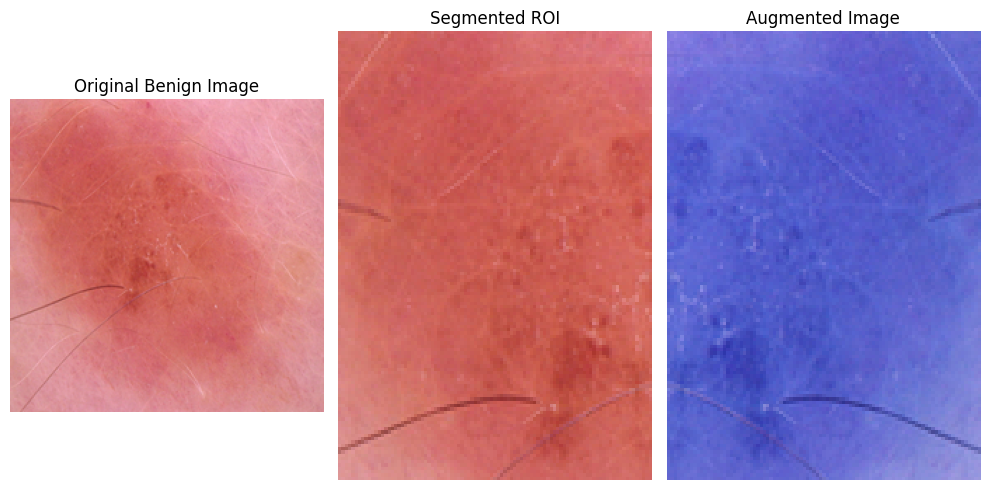

In [ ]:
# Ejemplo de segmentación y aumentación de datos
# Segmentar y aumentar una imagen benigna
sample_benign_image = benign_paths[0]
roi_segmented = segment_roi(sample_benign_image)
augmented_image = augment_data(roi_segmented)

# Ejemplo de preprocesamiento básico de imagen
sample_preprocessed_image = preprocess_image(sample_benign_image)

# Mostrar ejemplos de imágenes
plt.figure(figsize=(10, 5))
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(cv2.imread(sample_benign_image), cv2.COLOR_BGR2RGB))
plt.title('Original Benign Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(roi_segmented, cv2.COLOR_BGR2RGB))
plt.title('Segmented ROI')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(augmented_image)
plt.title('Augmented Image')
plt.axis('off')

plt.tight_layout()
plt.show()

---
# 4. Modelado
# 5. Evaluación

---



---
**1. Modelo Simple Secuencial con Capas Convolucionales y Densas**
---

Utilizar modelo secuencial de Keras, que permite apilar capas; una encima de la otra de manera secuencial.

Añadir capas convolucionales y de pooling: Se añaden tres capas convolucionales, cada una seguida de una capa de Max Pooling para reducir la dimensionalidad de las características extraídas.

Añadir capa de aplanamiento y capas densas: Después de las capas convolucionales y de pooling, se añade una capa de aplanamiento (Flatten) para convertir los mapas de características 2D en un vector 1D, luego dos capas densas completamente conectadas.

Compilar el modelo: Se compila el modelo utilizando el optimizador Adam, la función de pérdida binary_crossentropy para problemas de clasificación binaria y se utiliza la métrica de precisión (accuracy) para evaluar el rendimiento durante el entrenamiento.


---



## Modelado, Entrenamiento y Evaluación

Found 2637 images belonging to 2 classes.
Found 660 images belonging to 2 classes.
Epoch 1/5
82/82 [==============================] - 46s 546ms/step - loss: 0.5442 - accuracy: 0.7121 - val_loss: 0.4708 - val_accuracy: 0.7797
Epoch 2/5
82/82 [==============================] - 17s 206ms/step - loss: 0.4393 - accuracy: 0.7781 - val_loss: 0.4103 - val_accuracy: 0.7922
Epoch 3/5
82/82 [==============================] - 18s 215ms/step - loss: 0.4188 - accuracy: 0.7935 - val_loss: 0.3839 - val_accuracy: 0.8047
Epoch 4/5
82/82 [==============================] - 15s 185ms/step - loss: 0.3860 - accuracy: 0.8115 - val_loss: 0.3627 - val_accuracy: 0.8281
Epoch 5/5
82/82 [==============================] - 15s 188ms/step - loss: 0.3690 - accuracy: 0.8154 - val_loss: 0.3759 - val_accuracy: 0.7969


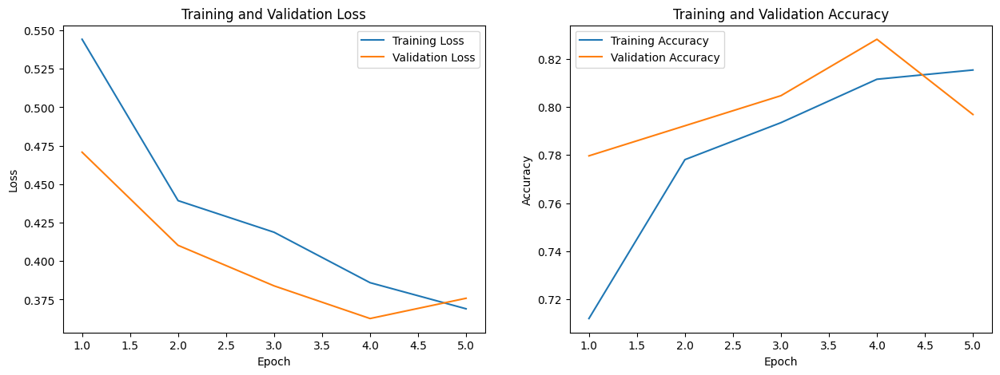

Modelo guardado exitosamente en /content/gdrive/MyDrive/minidataset/modelo_entrenado.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
import os
import numpy as np
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
import matplotlib.pyplot as plt

# Definir rutas de los datos
# Rutas de los datos DATASET COMPLETO
train_dir_benign = '/content/gdrive/MyDrive/dataset/train/benign/'
train_dir_malignant = '/content/gdrive/MyDrive/dataset/train/malignant/'
test_dir_benign = '/content/gdrive/MyDrive/dataset/test/benign/'
test_dir_malignant = '/content/gdrive/MyDrive/dataset/test/malignant/'

# Rutas generales de Train/Test:
train_dir = '/content/gdrive/MyDrive/dataset/train'
test_dir = '/content/gdrive/MyDrive/dataset/test'

# Parámetros
img_size = 150
batch_size = 32
epochs = 5

# Crear generadores de imágenes
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_size, img_size),
    batch_size=batch_size,
    class_mode='binary')

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_size, img_size),
    batch_size=batch_size,
    class_mode='binary')

# Crear modelo:
# # Crear un modelo secuencial
simple_model = Sequential()

# # Añadir capas convolucionales y de pooling
simple_model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(img_size, img_size, 3)))
simple_model.add(MaxPooling2D((2, 2)))
simple_model.add(Conv2D(64, (3, 3), activation='relu'))
simple_model.add(MaxPooling2D((2, 2)))
simple_model.add(Conv2D(128, (3, 3), activation='relu'))
simple_model.add(MaxPooling2D((2, 2)))

# # Añadir capa de aplanamiento y capas densas
simple_model.add(Flatten())
simple_model.add(Dense(128, activation='relu'))
simple_model.add(Dense(1, activation='sigmoid'))

# Compilar el modelo
simple_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Entrenar el modelo
history = simple_model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // batch_size,
    epochs=epochs,
    validation_data=test_generator,
    validation_steps=test_generator.samples // batch_size)

# Graficar métricas de entrenamiento

train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

epochs_range = range(1, epochs + 1)

plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)
plt.plot(epochs_range, train_loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(epochs_range, train_accuracy, label='Training Accuracy')
plt.plot(epochs_range, val_accuracy, label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.show()

# Guardar el modelo
ruta_modelo = "/content/gdrive/MyDrive/minidataset/modelo_entrenado.h5"
simple_model.save(ruta_modelo)
print("Modelo guardado exitosamente en", ruta_modelo)



## Predicción

1/1 [==============================] - 0s 22ms/step


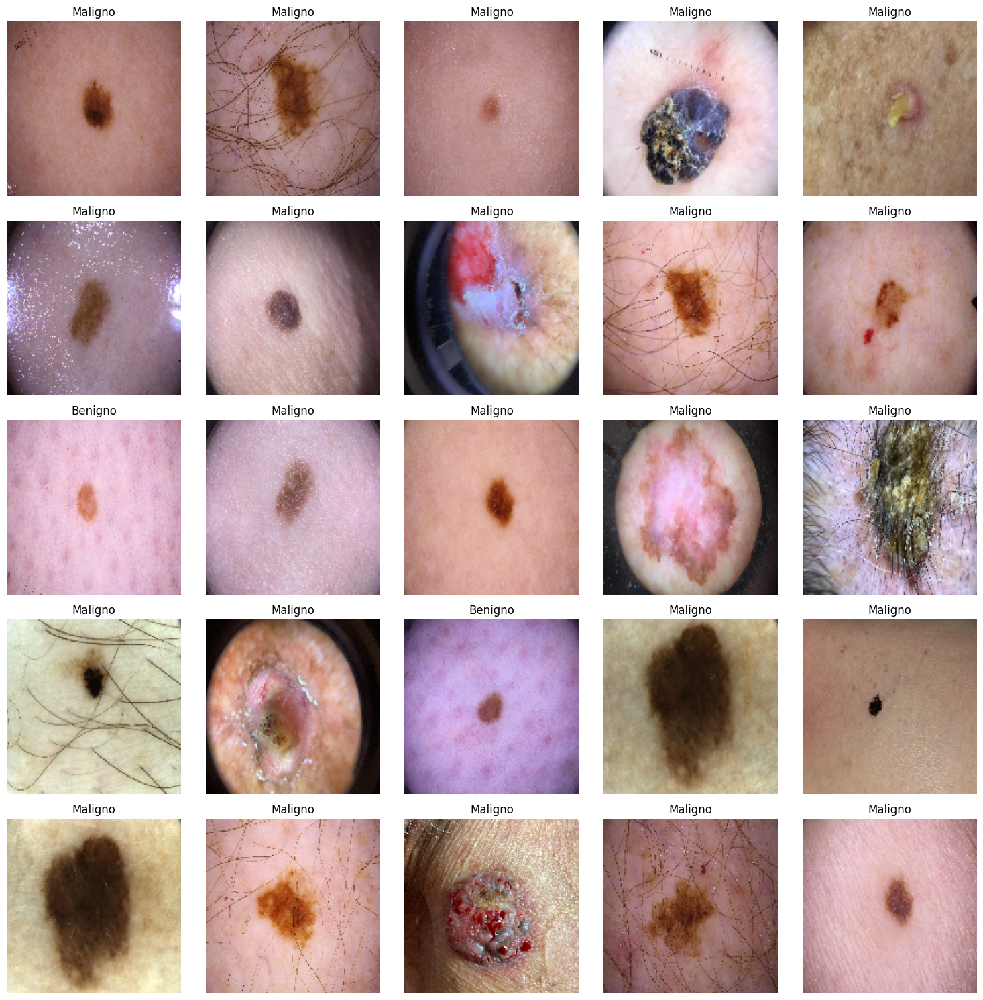

Predicción para la imagen 1: [0.6898298]
Predicción para la imagen 2: [0.9659275]
Predicción para la imagen 3: [0.5072853]
Predicción para la imagen 4: [0.99170953]
Predicción para la imagen 5: [0.97678417]
Predicción para la imagen 6: [0.79220116]
Predicción para la imagen 7: [0.66414016]
Predicción para la imagen 8: [0.919524]
Predicción para la imagen 9: [0.73702574]
Predicción para la imagen 10: [0.6478408]
Predicción para la imagen 11: [0.39332148]
Predicción para la imagen 12: [0.65755683]
Predicción para la imagen 13: [0.5159437]
Predicción para la imagen 14: [0.9036265]
Predicción para la imagen 15: [0.8696012]
Predicción para la imagen 16: [0.9182022]
Predicción para la imagen 17: [0.99431026]
Predicción para la imagen 18: [0.47576663]
Predicción para la imagen 19: [0.99026614]
Predicción para la imagen 20: [0.97944015]
Predicción para la imagen 21: [0.99384046]
Predicción para la imagen 22: [0.8905721]
Predicción para la imagen 23: [0.99675447]
Predicción para la imagen 24: [

In [ ]:
# Definir el tamaño de la imagen
img_size = 150

# Ruta de la carpeta de imágenes
otras_dir = '/content/gdrive/MyDrive/dataset/predicciones/'


# Obtener la lista de archivos de imágenes en la carpeta
otras_images = [os.path.join(otras_dir, img) for img in os.listdir(otras_dir)]

# Crear una lista para almacenar las imágenes convertidas
otras_data = []

# Leer y procesar las imágenes
for img_path in otras_images:
    img = image.load_img(img_path, target_size=(img_size, img_size))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0) / 255.0  # Normalizar la imagen y agregar una dimensión adicional para el lote
    otras_data.append(img_array)

# Convertir la lista de imágenes a un array numpy
otras_data = np.vstack(otras_data)

# Realizar predicciones
predictions = simple_model.predict(otras_data)

# Número de imágenes a mostrar
num_images = len(otras_images)

# Calcular el número de filas y columnas necesarias para mostrar como maximo 5 imagenes por fila.
num_cols = 5
num_rows = (num_images + num_cols - 1) // num_cols  # Calcula las filas necesarias

# Crear subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(num_cols * 3, num_rows * 3))

# Mostrar las imágenes y sus predicciones
for i in range(num_images):
    img_path = otras_images[i]
    img = image.load_img(img_path, target_size=(img_size, img_size))

    row = i // num_cols
    col = i % num_cols
    axs[row, col].imshow(img)
    axs[row, col].axis('off')

    # Agregar la leyenda según la predicción
    if predictions[i][0] > 0.5:
        axs[row, col].set_title("Maligno")
    else:
        axs[row, col].set_title("Benigno")

# Ocultar subplots vacíos
for i in range(num_images, num_rows * num_cols):
    row = i // num_cols
    col = i % num_cols
    axs[row, col].axis('off')

plt.tight_layout()
plt.show()

# Imprimir predicciones
for i in range(num_images):
    print(f"Predicción para la imagen {i + 1}: {predictions[i]}")







---



---
**2. Modelo Basado en VGG16 Pre entrenado**
---


- Cargar el modelo VGG16 preentrenado.
- Añadir capas de clasificación en la parte superior.
- Compilar el modelo.
---


---
**Modelado Basado en VGG16**
---



---



In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from keras.models import load_model
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.applications import VGG16
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adam
from keras import layers, models

# Parámetros
img_height, img_width = 224, 224
batch_size = 32
epochs = 10

# Rutas de los datos DATASET COMPLETO
train_dir_benign = '/content/gdrive/MyDrive/dataset/train/benign/'
train_dir_malignant = '/content/gdrive/MyDrive/dataset/train/malignant/'
test_dir_benign = '/content/gdrive/MyDrive/dataset/test/benign/'
test_dir_malignant = '/content/gdrive/MyDrive/dataset/test/malignant/'

# Rutas generales de Train/Test:
train_dir = '/content/gdrive/MyDrive/dataset/train'
test_dir = '/content/gdrive/MyDrive/dataset/test'

# Preprocesamiento de datos y aumentación
train_datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.2  # Usar 20% de los datos de entrenamiento para validación
)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary',
    subset='training'
)

validation_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary',
    subset='validation'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary'
)

# Construcción del modelo
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))
for layer in base_model.layers:
    layer.trainable = False

model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(512, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(1, activation='sigmoid')
])

model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# Definir EarlyStopping y ModelCheckpoint
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
checkpoint = ModelCheckpoint('/content/gdrive/MyDrive/best_model.keras', monitor='val_loss', save_best_only=True, mode='min')



Found 2110 images belonging to 2 classes.
Found 527 images belonging to 2 classes.
Found 660 images belonging to 2 classes.
58889256/58889256 [==============================] - 0s 0us/step


 ---
**Entrenamiento y Evaluación de Modelo Basado en VGG16**
---

In [ ]:

# Entrenar el modelo con EarlyStopping y ModelCheckpoint
history = model.fit(
    train_generator,
    epochs=epochs,
    validation_data=validation_generator,
    callbacks=[early_stopping, checkpoint]
)

# Evaluar el modelo en el conjunto de prueba
test_loss, test_acc = model.evaluate(test_generator)
print(f'Accuracy on test set: {test_acc}')

# Guardar el modelo en formato Keras
model.save('/content/gdrive/MyDrive/best_model.keras')



Epoch 1/10
66/66 [==============================] - 65s 835ms/step - loss: 0.6599 - accuracy: 0.6047 - val_loss: 0.6263 - val_accuracy: 0.6319
Epoch 2/10
66/66 [==============================] - 43s 654ms/step - loss: 0.6145 - accuracy: 0.6706 - val_loss: 0.5843 - val_accuracy: 0.7230
Epoch 3/10
66/66 [==============================] - 43s 657ms/step - loss: 0.5800 - accuracy: 0.7109 - val_loss: 0.5549 - val_accuracy: 0.7211
Epoch 4/10
66/66 [==============================] - 43s 659ms/step - loss: 0.5540 - accuracy: 0.7360 - val_loss: 0.5279 - val_accuracy: 0.7685
Epoch 5/10
66/66 [==============================] - 44s 663ms/step - loss: 0.5314 - accuracy: 0.7498 - val_loss: 0.5106 - val_accuracy: 0.7647
Epoch 6/10
66/66 [==============================] - 44s 656ms/step - loss: 0.5144 - accuracy: 0.7810 - val_loss: 0.4981 - val_accuracy: 0.7571
Epoch 7/10
66/66 [==============================] - 44s 666ms/step - loss: 0.4985 - accuracy: 0.7801 - val_loss: 0.4900 - val_accuracy: 0.7704

---
**Predicción de Modelo Basado en VGG16**
---


El archivo se ha guardado correctamente y está disponible.
1/1 [==============================] - 0s 25ms/step


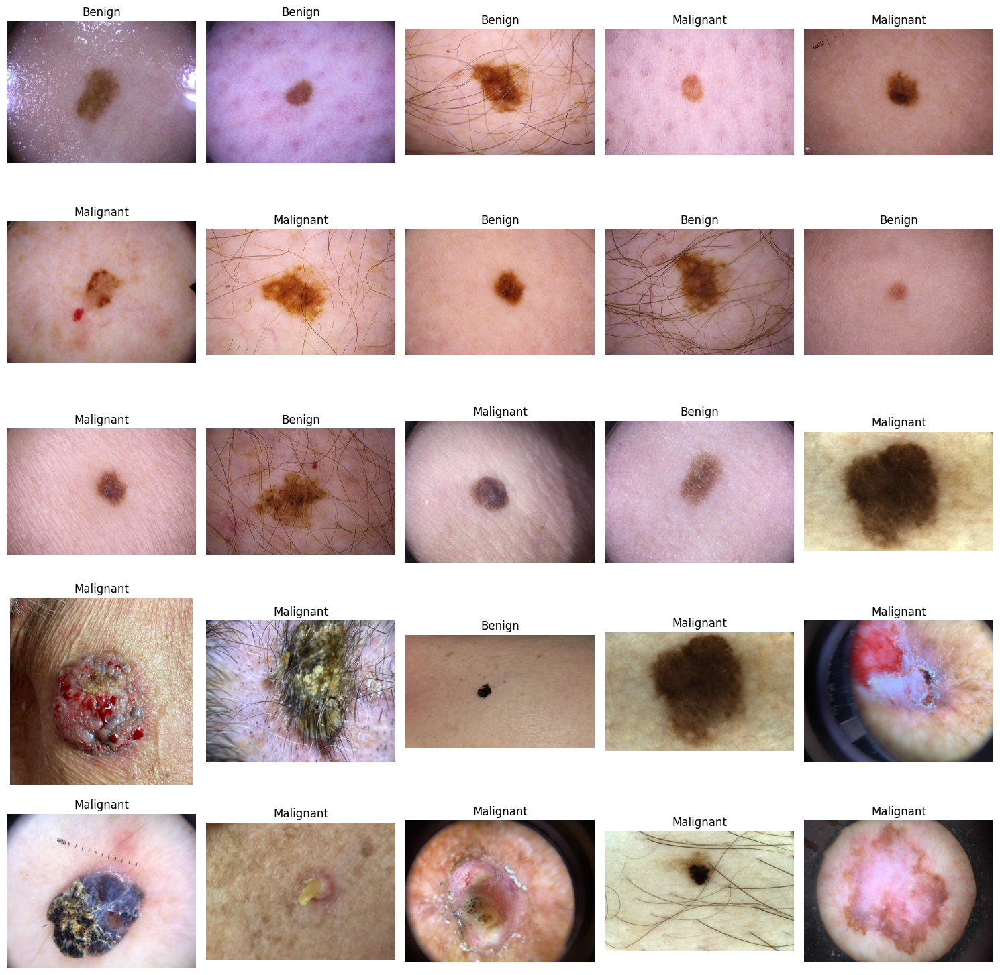

In [ ]:
# Verificar la existencia del archivo guardado
model_path = '/content/gdrive/MyDrive/best_model.keras'
if os.path.exists(model_path):
    print("El archivo se ha guardado correctamente y está disponible.")
else:
    print("Error al guardar el archivo. Verifica la ruta y el proceso de guardado.")

# Cargar el modelo
model = load_model(model_path)

# Función para predecir la imagen
def predict_image(image_path):
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError("Error al cargar la imagen. Verifica la ruta y el nombre del archivo.")
    img = cv2.resize(img, (img_height, img_width))
    img = np.expand_dims(img, axis=0) / 255.0
    prediction = model.predict(img)
    return 'Malignant' if prediction[0][0] > 0.5 else 'Benign'

# Ruta de la carpeta de imágenes
otras_dir = '/content/gdrive/MyDrive/dataset/predicciones/'

# Obtener la lista de archivos de imágenes en la carpeta
otras_images = [os.path.join(otras_dir, img) for img in os.listdir(otras_dir) if img.endswith(('.png', '.jpg', '.jpeg'))]

# Número total de imágenes
total_images = len(otras_images)

# Calcular el número de filas y columnas necesarias para mostrar como maximo 5 imagenes por fila.
num_cols = 5
num_rows = (total_images + num_cols - 1) // num_cols  # Calcula las filas necesarias

# Crear subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(num_cols * 3, num_rows * 3))

# Mostrar las imágenes y sus predicciones
for i, img_path in enumerate(otras_images):
    img = cv2.imread(img_path)
    if img is not None:  # Verificar que la imagen se cargó correctamente
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        row = i // num_cols
        col = i % num_cols
        axs[row, col].imshow(img)
        axs[row, col].axis('off')
        axs[row, col].set_title(predict_image(img_path))
    else:  # Si la imagen no se cargó, mostrar un mensaje de error
        row = i // num_cols
        col = i % num_cols
        axs[row, col].text(0.5, 0.5, 'Image not found', horizontalalignment='center', verticalalignment='center', transform=axs[row, col].transAxes)
        axs[row, col].axis('off')

# Ocultar subplots vacíos
for i in range(total_images, num_rows * num_cols):
    row = i // num_cols
    col = i % num_cols
    axs[row, col].axis('off')

plt.tight_layout()
plt.show()


## **Evaluación y visualización de métricas adicionales para VGG16**
---




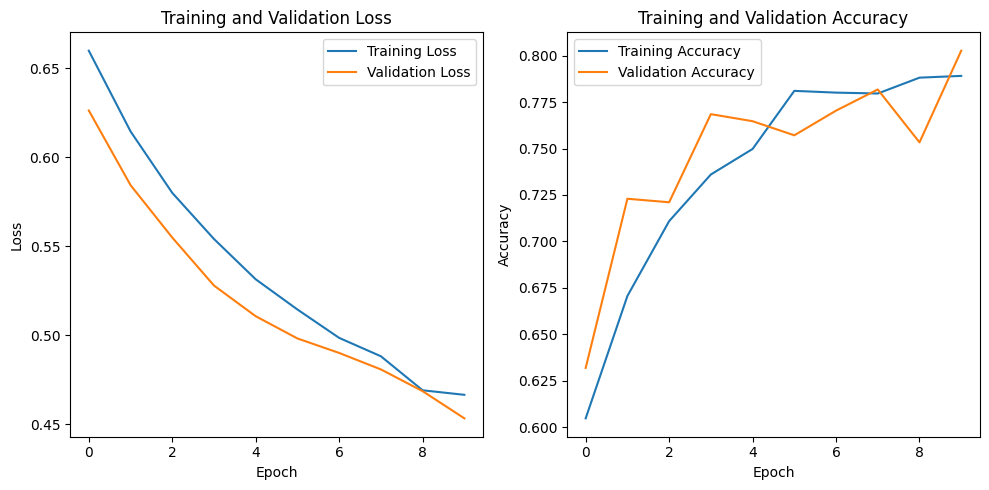

In [ ]:
# Mostrar gráficos de entrenamiento y validación
plt.figure(figsize=(10, 5))

# Loss plot
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

# Accuracy plot
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.tight_layout()
plt.show()



---



---
**3. Modelo Basado en ResNet50 Pre entrenado**
---


Utilización de **ResNet50** es una variante profunda de la arquitectura de redes neuronales residuales que puede ser muy efectiva para tareas de clasificación de imágenes, como nuestro proyecto de clasificación de lunares.

El Modelo es una Red Neuronal Convolucional (CNN) basada en la arquitectura ResNet50 preentrenada en el dataset ImageNet. La arquitectura ResNet50 es una red profunda con 50 capas que ha demostrado ser muy efectiva en la clasificación de imágenes. En este modelo, se utiliza ResNet50 como base y se agregan capas adicionales para la tarea específica de clasificación binaria (por ejemplo, benigno vs. maligno).

Componentes del Modelo
Modelo Base (ResNet50):

Preentrenado en ImageNet: preentrenada en el dataset ImageNet.

Include Top=False: Se omiten las capas superiores (clasificación) originales de ResNet50 para permitir la personalización.

Input Shape: La entrada del modelo tiene dimensiones específicas (224,224,3)

Capas No Entrenables: Las capas del modelo base se congelan (layer.trainable = False) para evitar que sus pesos se actualicen durante el entrenamiento. Esto permite aprovechar las características ya aprendidas por ResNet50 sin sobreajustar el modelo a nuestro dataset más pequeño.

Capas Adicionales:

GlobalAveragePooling2D: reduce la dimensionalidad y conserva la información más relevante.

Dense (512, activation='relu'): Una capa densa completamente conectada con 512 unidades y función de activación ReLU. Esta capa introduce no linealidades y permite al modelo aprender combinaciones complejas de características.

Dropout (0.5): Esta capa aplica Dropout con una tasa del 50%, ayudando a prevenir el overfitting durante el entrenamiento al desactivar aleatoriamente la mitad de las neuronas en esta capa en cada paso de entrenamiento.

Dense (1, activation='sigmoid'): La capa de salida con una unidad y función de activación sigmoide. Esta capa produce una probabilidad de que la imagen pertenezca a la clase positiva (por ejemplo, maligno).

Compilación del Modelo:

Optimizador: Adam con una tasa de aprendizaje de 0.0001.

Loss: binary_crossentropy que es adecuado para problemas de clasificación binaria.

Métricas: accuracy para evaluar el desempeño del modelo durante el entrenamiento y la validación.

Callbacks
ModelCheckpoint: Guarda el mejor modelo basado en la pérdida de validación mínima (val_loss), ayudando a preservar el modelo con el mejor rendimiento durante el entrenamiento.

EarlyStopping: Detiene el entrenamiento si la pérdida de validación no mejora después de 10 épocas, restaurando los pesos del mejor modelo encontrado.


En resumen, éste modelo combina la potencia de la arquitectura ResNet50 para la extracción de características con capas personalizadas para la clasificación binaria, optimizando tanto la precisión como la generalización mediante el uso de técnicas como el Dropout y los callbacks de ModelCheckpoint y EarlyStopping.

---


## Modelado, Entrenamiento


Found 2110 images belonging to 2 classes.
Found 527 images belonging to 2 classes.
Found 660 images belonging to 2 classes.
94765736/94765736 [==============================] - 1s 0us/step
Epoch 1/10
66/66 [==============================] - ETA: 0s - loss: 0.7555 - accuracy: 0.5000

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


66/66 [==============================] - 60s 761ms/step - loss: 0.7555 - accuracy: 0.5000 - val_loss: 0.6931 - val_accuracy: 0.5465
Epoch 2/10
66/66 [==============================] - 44s 671ms/step - loss: 0.7334 - accuracy: 0.5194 - val_loss: 0.6812 - val_accuracy: 0.5541
Epoch 3/10
66/66 [==============================] - 46s 691ms/step - loss: 0.7133 - accuracy: 0.5237 - val_loss: 0.6773 - val_accuracy: 0.5579
Epoch 4/10
66/66 [==============================] - 44s 671ms/step - loss: 0.6978 - accuracy: 0.5493 - val_loss: 0.6739 - val_accuracy: 0.5636
Epoch 5/10
66/66 [==============================] - 44s 667ms/step - loss: 0.7001 - accuracy: 0.5332 - val_loss: 0.6736 - val_accuracy: 0.5522
Epoch 6/10
66/66 [==============================] - 44s 669ms/step - loss: 0.6903 - accuracy: 0.5583 - val_loss: 0.6678 - val_accuracy: 0.6053
Epoch 7/10
66/66 [==============================] - 44s 663ms/step - loss: 0.6818 - accuracy: 0.5687 - val_loss: 0.6651 - val_accuracy: 0.5731
Epoch 8/10

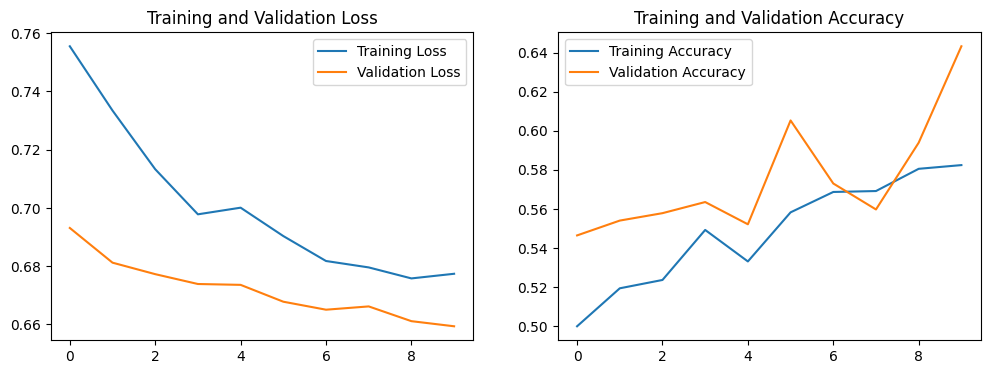

In [ ]:
import os
from keras.preprocessing.image import ImageDataGenerator
from keras.applications import ResNet50
from keras.models import Sequential
from keras.layers import GlobalAveragePooling2D, Dense, Dropout
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint, EarlyStopping
import matplotlib.pyplot as plt

# Rutas de los datos
# Rutas generales de Train/Test:
train_dir = '/content/gdrive/MyDrive/dataset/train'
test_dir = '/content/gdrive/MyDrive/dataset/test'


# Parámetros
img_height, img_width = 224, 224
batch_size = 32

# Preprocesamiento de datos y aumentación
train_datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.2  # Usar 20% de los datos de entrenamiento para validación
)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary',
    subset='training'
)

validation_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary',
    subset='validation'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary'
)


# Construcción del modelo
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))
for layer in base_model.layers:
    layer.trainable = False

model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# Callbacks
checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, mode='min')
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Entrenar el modelo
history = model.fit(
    train_generator,
    epochs=10,
    validation_data=validation_generator,
    callbacks=[checkpoint, early_stopping]
)

# Evaluar el modelo
evaluation = model.evaluate(test_generator)
print(f"Loss: {evaluation[0]}")
print(f"Accuracy: {evaluation[1]}")

# Guardar el modelo entrenado
model.save('/content/gdrive/MyDrive/mole_classifier_resnet50.h5')

# Graficar Training y Validation Loss/Accuracy
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.show()


In [ ]:
import os
from keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing import image
from keras.applications import ResNet50
from keras import layers, models
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint, EarlyStopping
import matplotlib.pyplot as plt
import numpy as np


# Rutas de los datos
train_dir_benign = '/content/gdrive/MyDrive/dataset/train/benign/'
train_dir_malignant = '/content/gdrive/MyDrive/dataset/train/malignant/'
test_dir_benign = '/content/gdrive/MyDrive/dataset/test/benign/'
test_dir_malignant = '/content/gdrive/MyDrive/dataset/test/malignant/'

# Rutas generales de Train/Test:
train_dir = '/content/gdrive/MyDrive/dataset/train'
test_dir = '/content/gdrive/MyDrive/dataset/test'

# Parámetros
img_height, img_width = 224, 224
batch_size = 32

# Preprocesamiento de datos y aumentación
train_datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.2  # Usar 20% de los datos de entrenamiento para validación
)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary',
    subset='training'
)

validation_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary',
    subset='validation'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary'
)

# Construcción del modelo
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))
for layer in base_model.layers:
    layer.trainable = False

model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(512, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(1, activation='sigmoid')
])

model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# Callbacks
checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, mode='min')
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Entrenar el modelo
history = model.fit(
    train_generator,
    epochs=10,
    validation_data=validation_generator,
    callbacks=[checkpoint, early_stopping]
)


Found 2110 images belonging to 2 classes.
Found 527 images belonging to 2 classes.
Found 660 images belonging to 2 classes.
Epoch 1/10
66/66 [==============================] - 50s 682ms/step - loss: 0.7700 - accuracy: 0.4882 - val_loss: 0.6825 - val_accuracy: 0.5503
Epoch 2/10
66/66 [==============================] - 44s 667ms/step - loss: 0.7398 - accuracy: 0.5133 - val_loss: 0.6810 - val_accuracy: 0.6129
Epoch 3/10
66/66 [==============================] - 44s 666ms/step - loss: 0.7153 - accuracy: 0.5355 - val_loss: 0.6765 - val_accuracy: 0.5541
Epoch 4/10
66/66 [==============================] - 43s 656ms/step - loss: 0.6962 - accuracy: 0.5327 - val_loss: 0.6828 - val_accuracy: 0.5503
Epoch 5/10
66/66 [==============================] - 43s 657ms/step - loss: 0.6958 - accuracy: 0.5536 - val_loss: 0.6805 - val_accuracy: 0.4535
Epoch 6/10
66/66 [==============================] - 45s 689ms/step - loss: 0.6870 - accuracy: 0.5630 - val_loss: 0.6652 - val_accuracy: 0.6015
Epoch 7/10
66/66 [

## Evaluación


21/21 [==============================] - 4s 201ms/step - loss: 0.6588 - accuracy: 0.6742
Loss: 0.6587514877319336
Accuracy: 0.6742424368858337


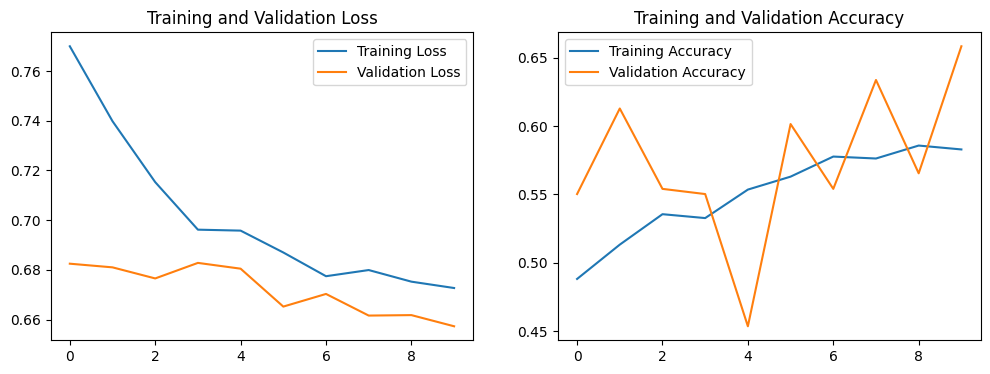

In [ ]:
# Evaluar el modelo
evaluation = model.evaluate(test_generator)
print(f"Loss: {evaluation[0]}")
print(f"Accuracy: {evaluation[1]}")

# Guardar el modelo entrenado
model.save('/content/gdrive/MyDrive/mole_classifier_resnet50.h5')

# Graficar Training y Validation Loss/Accuracy
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.show()


## Predicción:


1/1 [==============================] - 3s 3s/step


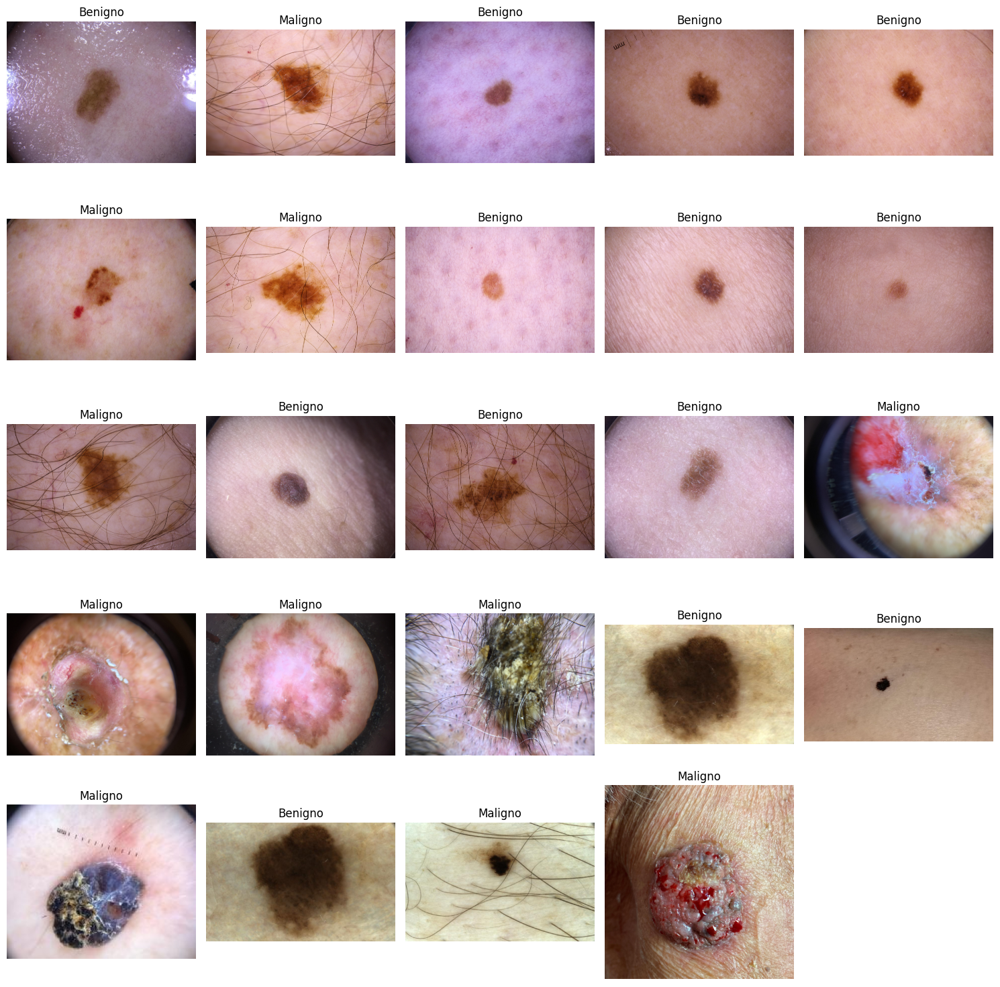

Predicción para la imagen 1: [0.49765134]
Predicción para la imagen 2: [0.55742544]
Predicción para la imagen 3: [0.46892676]
Predicción para la imagen 4: [0.47209847]
Predicción para la imagen 5: [0.4841203]
Predicción para la imagen 6: [0.50292134]
Predicción para la imagen 7: [0.5227163]
Predicción para la imagen 8: [0.47032836]
Predicción para la imagen 9: [0.468295]
Predicción para la imagen 10: [0.44724348]
Predicción para la imagen 11: [0.5026485]
Predicción para la imagen 12: [0.48802602]
Predicción para la imagen 13: [0.48251298]
Predicción para la imagen 14: [0.469239]
Predicción para la imagen 15: [0.5571917]
Predicción para la imagen 16: [0.5974303]
Predicción para la imagen 17: [0.5388895]
Predicción para la imagen 18: [0.7234138]
Predicción para la imagen 19: [0.4976068]
Predicción para la imagen 20: [0.4913638]
Predicción para la imagen 21: [0.64792687]
Predicción para la imagen 22: [0.48548713]
Predicción para la imagen 23: [0.5796128]
Predicción para la imagen 24: [0.6

In [ ]:
import matplotlib.pyplot as plt
from keras.preprocessing import image
from keras.models import load_model
import numpy as np
import os
import cv2
from keras import layers, models
from keras.preprocessing.image import ImageDataGenerator
# Definir los parámetros de imagen
img_height, img_width = 224, 224

# Cargar el modelo guardado  para predicciones
model = tf.keras.models.load_model('/content/gdrive/MyDrive/mole_classifier_resnet50.h5')

# Ruta de la carpeta de imágenes para predicciones
otras_dir = '/content/gdrive/MyDrive/dataset/predicciones/'

# Obtener la lista de archivos de imágenes en la carpeta
otras_images = [os.path.join(otras_dir, img) for img in os.listdir(otras_dir)]

# Crear una lista para almacenar las imágenes convertidas
otras_data = []

# Leer y procesar las imágenes
for img_path in otras_images:
    img = image.load_img(img_path, target_size=(img_height, img_width))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0) / 255.0  # Normalizar la imagen y agregar una dimensión adicional para el lote
    otras_data.append(img_array)

# Convertir la lista de imágenes a un array numpy
otras_data = np.vstack(otras_data)

# Realizar predicciones
predictions = model.predict(otras_data)

# Mostrar las imágenes y sus predicciones

# Función para predecir la categoría de la imagen
def predict_image(prediction):
    return "Maligno" if prediction > 0.5 else "Benigno"

# Número total de imágenes
total_images = len(otras_images)

# Calcular el número de filas y columnas necesarias para mostrar como maximo 5 imagenes por fila
num_cols = 5
num_rows = (total_images + num_cols - 1) // num_cols  # Calcula las filas necesarias

# Crear subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(num_cols * 3, num_rows * 3))

# Mostrar las imágenes y sus predicciones
for i, img_path in enumerate(otras_images):
    img = cv2.imread(img_path)
    if img is not None:  # Verificar que la imagen se cargó correctamente
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        row = i // num_cols
        col = i % num_cols
        axs[row, col].imshow(img)
        axs[row, col].axis('off')
        axs[row, col].set_title(predict_image(predictions[i][0]))
    else:  # Si la imagen no se cargó, mostrar un mensaje de error
        row = i // num_cols
        col = i % num_cols
        axs[row, col].text(0.5, 0.5, 'Image not found', horizontalalignment='center', verticalalignment='center', transform=axs[row, col].transAxes)
        axs[row, col].axis('off')

# Ocultar subplots vacíos
for i in range(total_images, num_rows * num_cols):
    row = i // num_cols
    col = i % num_cols
    axs[row, col].axis('off')

plt.tight_layout()
plt.show()
# Imprimir predicciones
for i in range(total_images):
    print(f"Predicción para la imagen {i + 1}: {predictions[i]}")



## **Evaluación y visualización de métricas adicionales para Resnet50**
---




**Métricas adicionales para modelo de clasificación basado en Resnet50**

Para evaluar tu modelo con métricas adicionales, como la **matriz de confusión, la precisión, el recall, y el F1-score**, se necesita:
1. cargar y preprocesar las imágenes
2. realizar predicciones
3. calcular las métricas de rendimiento.


**Gráfico Curva ROC y Matriz de confusión**
---

21/21 [==============================] - 2s 94ms/step


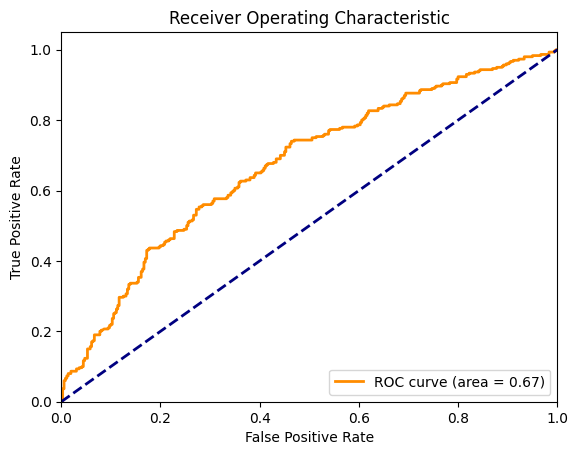

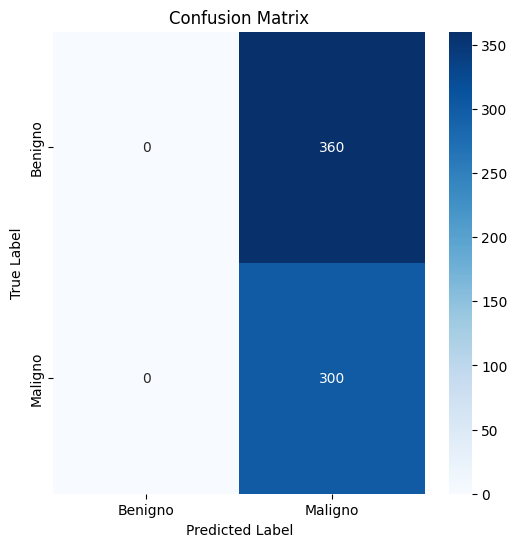

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from sklearn.metrics import confusion_matrix, roc_curve, auc
import seaborn as sns


# Definir los nombres de las clases
class_names = ['Benigno', 'Maligno']

# Función para listar todas las imágenes en una carpeta y obtener sus rutas
def list_images_in_directory(directory_path):
    image_paths = []
    for root, _, files in os.walk(directory_path):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                image_paths.append(os.path.join(root, file))
    return image_paths

# Función para cargar y mostrar imágenes con etiquetas y predicciones
def show_images_with_predictions(images_paths, true_labels, predicted_labels, class_names, images_per_row=5):
    num_images = len(images_paths)
    num_rows = (num_images + images_per_row - 1) // images_per_row  # Calcular el número de filas necesarias

    plt.figure(figsize=(15, num_rows * 3))
    for i, img_path in enumerate(images_paths):
        plt.subplot(num_rows, images_per_row, i + 1)

        # Verificar si la imagen existe
        if not os.path.exists(img_path):
            print(f"Error: La imagen {img_path} no existe.")
            continue

        # Cargar la imagen
        img = image.load_img(img_path, target_size=(224, 224))
        plt.imshow(img)
        plt.axis('off')

        # Definir el color del título según coincidencia
        if true_labels[i] == predicted_labels[i]:
            color = 'green'  # Coinciden: etiqueta verdadera y predicción
        else:
            color = 'red'    # No coinciden: etiqueta verdadera y predicción

        # Añadir etiquetas y predicciones
        plt.title(f'True: {class_names[true_labels[i]]}\nPredicted: {class_names[predicted_labels[i]]}', fontsize=10, color=color)

    plt.tight_layout()
    plt.show()

# Listar imágenes en los directorios de prueba
benign_test_dir = '/content/gdrive/MyDrive/dataset/test/benign/'
malignant_test_dir = '/content/gdrive/MyDrive/dataset/test/malignant/'

benign_image_paths = list_images_in_directory(benign_test_dir)
malignant_image_paths = list_images_in_directory(malignant_test_dir)

# Crear listas de rutas de imágenes, etiquetas verdaderas y predicciones
images_paths = benign_image_paths + malignant_image_paths
true_labels = [0] * len(benign_image_paths) + [1] * len(malignant_image_paths)

# Filtrar las imágenes que existen
filtered_images_paths = []
filtered_true_labels = []

for img_path, label in zip(images_paths, true_labels):
    if os.path.exists(img_path):
        filtered_images_paths.append(img_path)
        filtered_true_labels.append(label)

# Preprocesar las imágenes
def preprocess_images(image_paths):
    images = []
    for img_path in image_paths:
        img = image.load_img(img_path, target_size=(224, 224))
        img_array = image.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)
        images.append(img_array)
    return np.vstack(images)

# Preprocesar todas las imágenes filtradas
all_images = preprocess_images(filtered_images_paths)

# Obtener las predicciones del modelo
y_pred = model.predict(all_images)

# Convertir las predicciones en clases
y_pred_classes = (y_pred > 0.5).astype(int).flatten()

# Verificar longitudes de y_true y y_pred
if len(filtered_true_labels) != len(y_pred_classes):
    print(f"Error: longitudes diferentes - y_true: {len(filtered_true_labels)}, y_pred: {len(y_pred_classes)}")
else:
    # Calcular la curva ROC
    fpr, tpr, thresholds = roc_curve(filtered_true_labels, y_pred)
    roc_auc = auc(fpr, tpr)

    # Graficar la curva ROC
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc="lower right")
    plt.show()

    # Calcular la matriz de confusión
    conf_matrix = confusion_matrix(filtered_true_labels, y_pred_classes)

    # Graficar la matriz de confusión
    plt.figure(figsize=(6, 6))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Confusion Matrix')
    plt.show()

    # Mostrar las imágenes con etiquetas y predicciones
    show_images_with_predictions(filtered_images_paths, filtered_true_labels, y_pred_classes, class_names, images_per_row=5)



---

In [ ]:
import os

def list_files_in_directory(directory_path):
    for root, dirs, files in os.walk(directory_path):
        for file in files:
            print(os.path.join(root, file))

#Listar archivos en el directorio de test/benign
print("Archivos en el directorio benigno de test:")
list_files_in_directory('/content/gdrive/MyDrive/dataset/test/benign/')

# Listar archivos en el directorio de test/malignant
print("Archivos en el directorio maligno de test:")
list_files_in_directory('/content/gdrive/MyDrive/dataset/test/malignant/')


Archivos en el directorio benigno de test:
/content/gdrive/MyDrive/dataset/test/benign/1019.jpg
/content/gdrive/MyDrive/dataset/test/benign/1003.jpg
/content/gdrive/MyDrive/dataset/test/benign/1115.jpg
/content/gdrive/MyDrive/dataset/test/benign/1042.jpg
/content/gdrive/MyDrive/dataset/test/benign/1018.jpg
/content/gdrive/MyDrive/dataset/test/benign/1088.jpg
/content/gdrive/MyDrive/dataset/test/benign/1110.jpg
/content/gdrive/MyDrive/dataset/test/benign/1023.jpg
/content/gdrive/MyDrive/dataset/test/benign/1130.jpg
/content/gdrive/MyDrive/dataset/test/benign/1033.jpg
/content/gdrive/MyDrive/dataset/test/benign/1034.jpg
/content/gdrive/MyDrive/dataset/test/benign/1055.jpg
/content/gdrive/MyDrive/dataset/test/benign/105.jpg
/content/gdrive/MyDrive/dataset/test/benign/1135.jpg
/content/gdrive/MyDrive/dataset/test/benign/1025.jpg
/content/gdrive/MyDrive/dataset/test/benign/1134.jpg
/content/gdrive/MyDrive/dataset/test/benign/1139.jpg
/content/gdrive/MyDrive/dataset/test/benign/1070.jpg
/con

In [ ]:

images_paths = [
    '/content/gdrive/MyDrive/dataset/test/benign/1.jpg',  # Verificar si esta imagen realmente existe
    '/content/gdrive/MyDrive/dataset/test/malignant/3.jpg',  # Verificar si esta imagen realmente existe
    '/content/gdrive/MyDrive/dataset/test/benign/5.jpg',  # Verificar si esta imagen realmente existe
    '/content/gdrive/MyDrive/dataset/test/malignant/4.jpg'  # Verificar si esta imagen realmente existe
]


# Imágenes con las predicciones del modelo y las etiquetas verdaderas, resaltando en **verde** las coincidencias y en **rojo** las no coincidencias
---

21/21 [==============================] - 2s 97ms/step


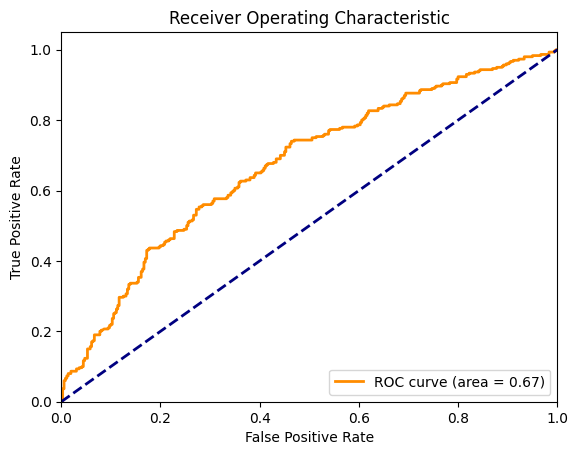

In [ ]:
# Listar imágenes en los directorios de prueba
benign_test_dir = '/content/gdrive/MyDrive/dataset/test/benign/'
malignant_test_dir = '/content/gdrive/MyDrive/dataset/test/malignant/'


benign_image_paths = list_images_in_directory(benign_test_dir)
malignant_image_paths = list_images_in_directory(malignant_test_dir)

# Crear listas de rutas de imágenes, etiquetas verdaderas y predicciones
images_paths = benign_image_paths + malignant_image_paths
true_labels = [0] * len(benign_image_paths) + [1] * len(malignant_image_paths)

# Filtrar las imágenes que existen
filtered_images_paths = []
filtered_true_labels = []

for img_path, label in zip(images_paths, true_labels):
    if os.path.exists(img_path):
        filtered_images_paths.append(img_path)
        filtered_true_labels.append(label)

# Preprocesar las imágenes
def preprocess_images(image_paths):
    images = []
    for img_path in image_paths:
        img = image.load_img(img_path, target_size=(224, 224))
        img_array = image.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)
        images.append(img_array)
    return np.vstack(images)

# Preprocesar todas las imágenes filtradas
all_images = preprocess_images(filtered_images_paths)

# Obtener las predicciones del modelo
y_pred = model.predict(all_images)

# Convertir las predicciones en clases
y_pred_classes = (y_pred > 0.5).astype(int).flatten()

# Verificar longitudes de y_true y y_pred
if len(filtered_true_labels) != len(y_pred):
    print(f"Error: longitudes diferentes - y_true: {len(filtered_true_labels)}, y_pred: {len(y_pred)}")
else:
    # Calcular la curva ROC
    fpr, tpr, thresholds = roc_curve(filtered_true_labels, y_pred)
    roc_auc = auc(fpr, tpr)

    # Graficar la curva ROC
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc="lower right")
    plt.show()

# Mostrar las imágenes con etiquetas y predicciones #ESTA FUNCION NO ME MUESTRA NADA
show_images_with_predictions(filtered_images_paths, filtered_true_labels, y_pred_classes, class_names, images_per_row=5)


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image

# Función para listar todas las imágenes en una carpeta y obtener sus rutas
def list_images_in_directory(directory_path):
    image_paths = []
    for root, _, files in os.walk(directory_path):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                image_paths.append(os.path.join(root, file))
    return image_paths

# Función para cargar y mostrar imágenes con etiquetas y predicciones
def show_images_with_predictions(images_paths, true_labels, predicted_labels, class_names, images_per_row=5):
    num_images = len(images_paths)
    num_rows = (num_images + images_per_row - 1) // images_per_row  # Calcular el número de filas necesarias

    plt.figure(figsize=(15, num_rows * 3))
    for i, img_path in enumerate(images_paths):
        plt.subplot(num_rows, images_per_row, i + 1)

        # Verificar si la imagen existe
        if not os.path.exists(img_path):
            print(f"Error: La imagen {img_path} no existe.")
            continue

        # Cargar la imagen
        img = image.load_img(img_path, target_size=(224, 224))
        plt.imshow(img)
        plt.axis('off')

        # Definir el color del título según coincidencia
        if true_labels[i] == predicted_labels[i]:
            color = 'green'  # Coinciden: etiqueta verdadera y predicción
        else:
            color = 'red'    # No coinciden: etiqueta verdadera y predicción

        # Añadir etiquetas y predicciones
        plt.title(f'True: {class_names[true_labels[i]]}\nPredicted: {class_names[predicted_labels[i]]}', fontsize=10, color=color)

    plt.tight_layout()
    plt.show()

# Listar imágenes en los directorios de prueba
benign_test_dir = '/content/gdrive/MyDrive/dataset/test/benign/'
malignant_test_dir = '/content/gdrive/MyDrive/dataset/test/malignant/'

benign_image_paths = list_images_in_directory(benign_test_dir)
malignant_image_paths = list_images_in_directory(malignant_test_dir)

# Crear listas de rutas de imágenes, etiquetas verdaderas y predicciones
images_paths = benign_image_paths + malignant_image_paths
true_labels = [0] * len(benign_image_paths) + [1] * len(malignant_image_paths)

# Preprocesar las imágenes
def preprocess_images(image_paths):
    images = []
    for img_path in image_paths:
        img = image.load_img(img_path, target_size=(224, 224))
        img_array = image.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)
        images.append(img_array)
    return np.vstack(images)

# Preprocesar todas las imágenes
all_images = preprocess_images(images_paths)

# Obtener las predicciones del modelo
y_pred = model.predict(all_images)

# Convertir las predicciones en clases
y_pred_classes = (y_pred > 0.5).astype(int).flatten()

class_names = ['Benigno', 'Maligno']  # Nombres de las clases

# Mostrar las imágenes con etiquetas y predicciones
show_images_with_predictions(images_paths, true_labels, y_pred_classes, class_names, images_per_row=5)


21/21 [==============================] - 2s 92ms/step


---
# 6. Despliegue

- Implementar el modelo en un entorno de producción.
- Crear una interfaz de usuario para subir imágenes y obtener predicciones.

# **Resumen de los tres modelos estudiados**

---


# **Resumen de características de los tres modelos:**


### **1. Modelo Simple Secuencial con Capas Convolucionales y Densas**
### **2. Modelo basado en VGG16 Pre entrenado**
### **3. Modelo basado en ResNet50 Pre entrenado**


---
# **1. Modelo Simple Secuencial con Capas Convolucionales y Densas**
## Características:
•	Simplicidad: Es fácil de entender e implementar.

•	Desde Cero: Construido completamente desde cero, lo que da total control sobre la arquitectura.

•	Menos Capas: Menos capas y complejidad comparado con modelos preentrenados.

•	Computacionalmente Menos Intensivo: Entrenamiento más rápido y menos demandante en términos de recursos computacionales.


# **2. Modelo basado en VGG16 Pre entrenado**
## Características:
•	Transfer Learning: Similar al modelo ResNet50, aprovecha las características aprendidas por VGG16.

•	Congelación de Capas: Mantiene las capas preentrenadas sin cambios, utilizando estas características para el nuevo problema.

•	Estructura: Usa una arquitectura diferente (VGG16), que es más simple en comparación con ResNet pero sigue siendo poderosa.

•	Capas Densas y Dropout: Añade capas densas y dropout para la clasificación y evitar el sobreajuste.

# **3. Modelo basado en ResNet50 Pre entrenado**
## Características:
•	Transfer Learning: Aprovecha las características aprendidas por ResNet50 en un gran conjunto de datos (ImageNet).

•	Congelación de Capas: Las capas del modelo base están congeladas, lo que mantiene las características aprendidas y reduce el tiempo de entrenamiento.

•	Complejidad: Mayor profundidad y complejidad que el modelo simple, adecuado para problemas más complejos.

•	Mejor Rendimiento: Generalmente ofrece un mejor rendimiento y precisión.



---



# **Resumen comparativo de los tres modelos respecto:**

**1.	Facilidad de Implementación:**

•	Modelo Simple: Más fácil de implementar y entender, adecuado para principiantes.

•	ResNet50 y VGG16: Requieren conocimientos de Transfer Learning, pero son más efectivos con datos limitados.

**2.	Tiempo de Entrenamiento:**

•	Modelo Simple: Más rápido de entrenar debido a su simplicidad.

•	ResNet50 y VGG16: Pueden ser más lentos en la fase de ajuste fino, pero la mayoría de los pesos ya están entrenados.

**3.	Rendimiento:**

•	Modelo Simple: Puede tener un rendimiento adecuado para problemas más simples.

•	ResNet50 y VGG16: Probablemente ofrecerán un mejor rendimiento y precisión debido a su arquitectura preentrenada y más profunda.

**4.	Recursos Computacionales:**

•	Modelo Simple: Menos exigente en términos de recursos computacionales.

•	ResNet50 y VGG16: Más exigentes debido a su complejidad y profundidad.

**5.	Ajuste Fino y Flexibilidad:**

•	Modelo Simple: Menos flexible en términos de ajuste fino y capacidades de Transfer Learning.

•	ResNet50 y VGG16: Muy flexibles, permiten congelar/descongelar capas para ajustar finamente el modelo a nuevos datos.

# **En resumen:**

**•	Modelo Simple:**  Adecuado para tareas más simples y para aquellos que comienzan con redes neuronales.

**•	Modelo ResNet50 y VGG16:**  Mejor para tareas más complejas y cuando se dispone de datos limitados, aprovechando la potencia del Transfer Learning. Entre ResNet50 y VGG16, la elección puede depender de la preferencia personal y de los resultados específicos en el conjunto de datos utilizado. ResNet50 generalmente es más avanzado y puede ofrecer mejor rendimiento, pero VGG16 es más sencillo y puede ser más fácil de manejar.
